# Mask RCNN _ iter5 Final

In [1]:
import warnings
warnings.filterwarnings('ignore')
import os
import sys
import json
import datetime
import numpy as np
import skimage.draw
import cv2
import random
import math
import re
import time
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg

from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
from mrcnn.visualize import display_instances
import mrcnn.model as modellib
from mrcnn.model import log
from mrcnn.config import Config
from mrcnn import model as modellib, utils

#import custom

# Root directory of the project
ROOT_DIR = "D:\MaskRCNN\MaskRCNN_TF1_newiter5"

DEFAULT_LOGS_DIR = os.path.join(ROOT_DIR, "logs")

MODEL_DIR = os.path.join(ROOT_DIR, "logs")


WEIGHTS_PATH = "D:\MaskRCNN\MaskRCNN_TF1_newiter5\logs\object20230421T0954\mask_rcnn_object_0895.h5"   # change it


Using TensorFlow backend.


In [2]:
class CustomConfig(Config):
    """Configuration for training on the custom  dataset.
    Derives from the base Config class and overrides some values.
    """
    # Give the configuration a recognizable name
    NAME = "object"

    IMAGES_PER_GPU = 1

    NUM_CLASSES = 1 + 7  # Background + phone,laptop and mobile

    # Number of training steps per epoch
    STEPS_PER_EPOCH = 10

    # Skip detections with < 90% confidence
    DETECTION_MIN_CONFIDENCE = 0.65

In [3]:
config = CustomConfig()
CUSTOM_DIR = os.path.join(ROOT_DIR, "/Dataset/")
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    DETECTION_MIN_CONFIDENCE = 0.65

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.65
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                20
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE        

In [4]:
# Code for Customdataset class. Same code is present in custom.py file also
class CustomDataset(utils.Dataset):

    def load_custom(self, dataset_dir, subset):

        self.add_class("object", 1, "bear")
        self.add_class("object", 2, "cheetah")
        self.add_class("object", 3, "deer")
        self.add_class("object", 4, "elephant")
        self.add_class("object", 5, "fox")
        self.add_class("object", 6, "pig")
        self.add_class("object", 7, "tiger")

        assert subset in ["train", "val"]
        dataset_dir = os.path.join(dataset_dir, subset)
        annotations1 = json.load(open('D:\\MaskRCNN\\MaskRCNN_TF1_newiter5\\Dataset\\val\\valuation_set_json.json'))

        annotations = list(annotations1.values())  # don't need the dict keys

        annotations = [a for a in annotations if a['regions']]
        
        # Add images
        for a in annotations:
           
            polygons = [r['shape_attributes'] for r in a['regions']] 
            objects = [s['region_attributes']['Names'] for s in a['regions']]
            print("objects:",objects)
            name_dict = {"bear": 1,"cheetah": 2,"deer": 3,"elephant": 4,"fox": 5,"pig": 6,"tiger": 7}
            num_ids = [name_dict[a] for a in objects]

            print("numids",num_ids)
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            height, width = image.shape[:2]

            self.add_image(
                "object", 
                image_id=a['filename'],  # use file name as a unique image id
                path=image_path,
                width=width, height=height,
                polygons=polygons,
                num_ids=num_ids
                )

    def load_mask(self, image_id):
       
        image_info = self.image_info[image_id]
        if image_info["source"] != "object":
            return super(self.__class__, self).load_mask(image_id)

        info = self.image_info[image_id]
        if info["source"] != "object":
            return super(self.__class__, self).load_mask(image_id)
        num_ids = info['num_ids']
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):

        	rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])

        	mask[rr, cc, i] = 1

        num_ids = np.array(num_ids, dtype=np.int32)
        return mask, num_ids #np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "object":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)


In [5]:
# Inspect the model in training or inference modes values: 'inference' or 'training'
TEST_MODE = "inference"
ROOT_DIR = "D:\MaskRCNN\MaskRCNN_TF1_newiter5"

def get_ax(rows=1, cols=1, size=16):
  """Return a Matplotlib Axes array to be used in all visualizations in the notebook.  Provide a central point to control graph sizes. Adjust the size attribute to control how big to render images"""
  _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
  return ax

# Load validation dataset
# Must call before using the dataset
CUSTOM_DIR = "D:\MaskRCNN\MaskRCNN_TF1_newiter5\Dataset"
dataset = CustomDataset()
dataset.load_custom(CUSTOM_DIR, "val")
dataset.prepare()
print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

objects: ['deer', 'deer']
numids [3, 3]
objects: ['cheetah']
numids [2]
objects: ['elephant']
numids [4]
objects: ['bear']
numids [1]
objects: ['pig']
numids [6]
objects: ['pig']
numids [6]
objects: ['bear']
numids [1]
objects: ['pig']
numids [6]
objects: ['bear']
numids [1]
objects: ['elephant']
numids [4]
objects: ['pig']
numids [6]
objects: ['cheetah']
numids [2]
objects: ['fox']
numids [5]
objects: ['elephant', 'elephant']
numids [4, 4]
objects: ['fox']
numids [5]
objects: ['pig', 'pig']
numids [6, 6]
objects: ['tiger']
numids [7]
objects: ['bear']
numids [1]
objects: ['fox']
numids [5]
objects: ['fox']
numids [5]
objects: ['fox']
numids [5]
objects: ['elephant']
numids [4]
objects: ['deer', 'deer', 'deer']
numids [3, 3, 3]
objects: ['fox']
numids [5]
objects: ['cheetah']
numids [2]
objects: ['deer', 'deer']
numids [3, 3]
objects: ['bear']
numids [1]
objects: ['fox']
numids [5]
objects: ['fox', 'fox']
numids [5, 5]
objects: ['fox', 'fox']
numids [5, 5]
objects: ['deer']
numids [3]


objects: ['bear', 'bear']
numids [1, 1]
objects: ['cheetah']
numids [2]
objects: ['bear']
numids [1]
objects: ['cheetah']
numids [2]
objects: ['pig']
numids [6]
objects: ['elephant']
numids [4]
objects: ['pig']
numids [6]
objects: ['bear']
numids [1]
objects: ['pig']
numids [6]
objects: ['deer', 'deer', 'deer']
numids [3, 3, 3]
objects: ['cheetah']
numids [2]
objects: ['pig']
numids [6]
objects: ['bear']
numids [1]
objects: ['deer']
numids [3]
objects: ['cheetah']
numids [2]
objects: ['bear']
numids [1]
objects: ['bear', 'bear']
numids [1, 1]
objects: ['fox']
numids [5]
objects: ['deer']
numids [3]
objects: ['pig']
numids [6]
objects: ['pig']
numids [6]
objects: ['cheetah']
numids [2]
objects: ['bear']
numids [1]
objects: ['fox']
numids [5]
objects: ['elephant', 'elephant', 'elephant']
numids [4, 4, 4]
objects: ['pig']
numids [6]
objects: ['fox', 'fox']
numids [5, 5]
objects: ['deer']
numids [3]
objects: ['bear']
numids [1]
objects: ['bear']
numids [1]
objects: ['cheetah']
numids [2]
o

In [6]:
print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Count: {}".format(dataset.num_classes))
for i, info in enumerate(dataset.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 400
Class Count: 8
  0. BG                                                
  1. bear                                              
  2. cheetah                                           
  3. deer                                              
  4. elephant                                          
  5. fox                                               
  6. pig                                               
  7. tiger                                             


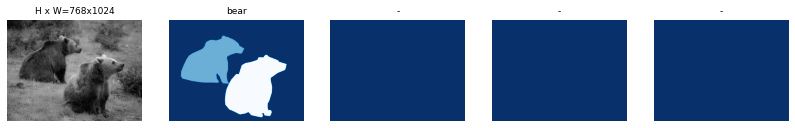

In [7]:
image_id=174
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

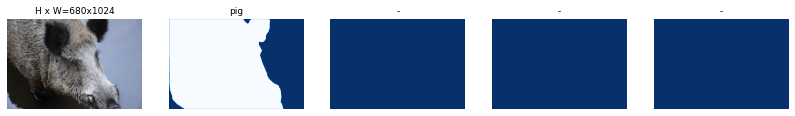

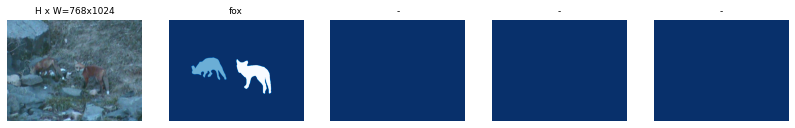

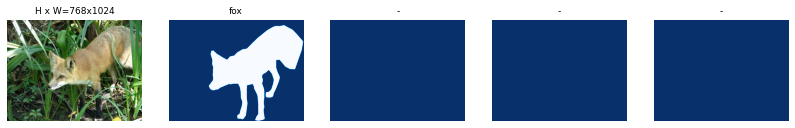

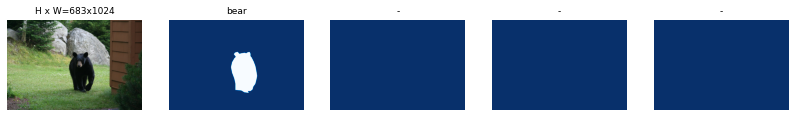

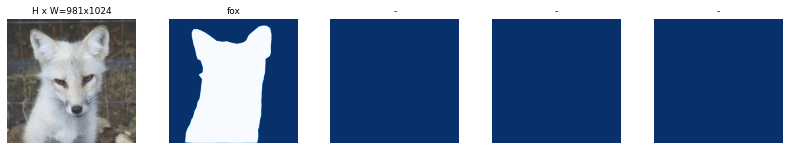

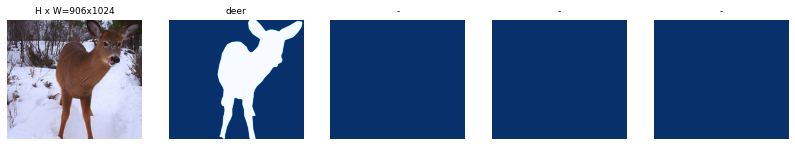

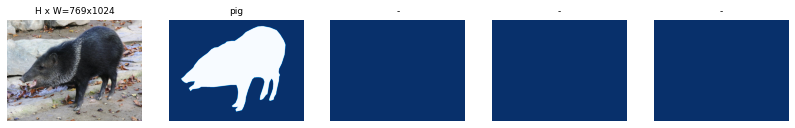

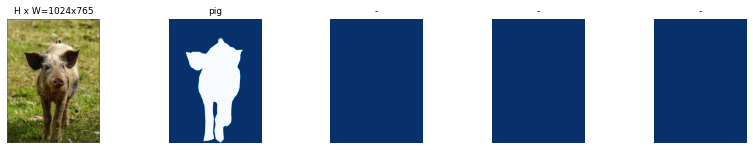

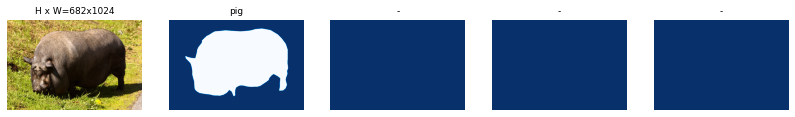

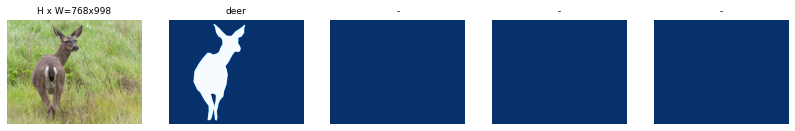

In [17]:
# Load and display random samples
image_ids = np.random.choice(dataset.image_ids, 10)
for image_id in image_ids:
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

image_id  335 D:\MaskRCNN\MaskRCNN_TF1_newiter5\Dataset\val\dc68dc17674364a4.jpg
image                    shape: (680, 1024, 3)        min:    0.00000  max:  255.00000  uint8
mask                     shape: (680, 1024, 3)        min:    0.00000  max:    1.00000  uint8
class_ids                shape: (3,)                  min:    3.00000  max:    3.00000  int32
bbox                     shape: (3, 4)                min:    2.00000  max: 1022.00000  int32


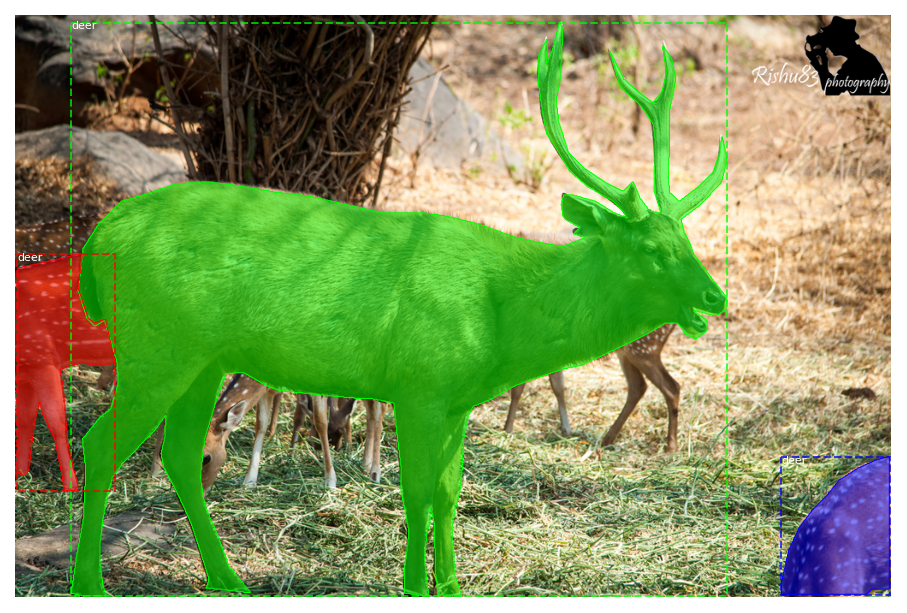

In [13]:
# Load random image and mask.
image_id = random.choice(dataset.image_ids)
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id ", image_id, dataset.image_reference(image_id))
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

In [7]:
# Build validation dataset
if config.NAME == 'shapes':
    dataset = shapes.ShapesDataset()
    dataset.load_shapes(500, config.IMAGE_SHAPE[0], config.IMAGE_SHAPE[1])
elif config.NAME == "coco":
    dataset = coco.CocoDataset()
    dataset.load_coco(COCO_DIR, "minival")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 400
Classes: ['BG', 'bear', 'cheetah', 'deer', 'elephant', 'fox', 'pig', 'tiger']


In [8]:
config = CustomConfig()
#LOAD MODEL. Create model in inference mode
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)








Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


In [7]:
from tensorflow.keras.utils import plot_model

In [8]:
!pip install pydot

In [13]:
!pip install pydotplus

  Created wheel for pydotplus: filename=pydotplus-2.0.2-py3-none-any.whl size=24575 sha256=a02be340a6fc757ec1c5ec61dd5bdc71b71187381bca8a8b8af0c997ec31fd09
  Stored in directory: c:\users\susan varghese\appdata\local\pip\cache\wheels\1f\5c\ba\f931f74fcac8f48b18ae597279203b1c1f92fc76249c2b6f66
Successfully built pydotplus


In [11]:
!pip install pip install h5py==2.10.0

In [22]:
import keras
print(keras.__version__)

2.2.5


In [23]:
import h5py
print(h5py.__version__)

3.1.0


In [9]:
# Load COCO weights Or, load the last model you trained
weights_path = WEIGHTS_PATH
# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  D:\MaskRCNN\MaskRCNN_TF1_newiter5\logs\object20230421T0954\mask_rcnn_object_0895.h5
Re-starting from epoch 895


In [36]:
model.keras_model.summary()

Model: "mask_rcnn"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        (None, None, None, 3 0                                            
__________________________________________________________________________________________________
zero_padding2d_1 (ZeroPadding2D (None, None, None, 3 0           input_image[0][0]                
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, None, None, 6 9472        zero_padding2d_1[0][0]           
__________________________________________________________________________________________________
bn_conv1 (BatchNorm)            (None, None, None, 6 256         conv1[0][0]                      
__________________________________________________________________________________________

In [9]:
#Now, we are ready for testing our model on any image.

#RUN DETECTION
#image_id = random.choice(dataset.image_ids)
image_id = 174
print("image id is :",image_id)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id,dataset.image_reference(image_id)))

# Run object detection
results = model.detect([image], verbose=1)



image id is : 174
image ID: object.2063cc4372428468.jpg (174) D:\MaskRCNN\MaskRCNN_TF1_newiter5\Dataset\val\2063cc4372428468.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


gt_class_id              shape: (2,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (2, 4)                min:   89.00000  max:  892.00000  int32
gt_mask                  shape: (1024, 1024, 2)       min:    0.00000  max:    1.00000  uint8


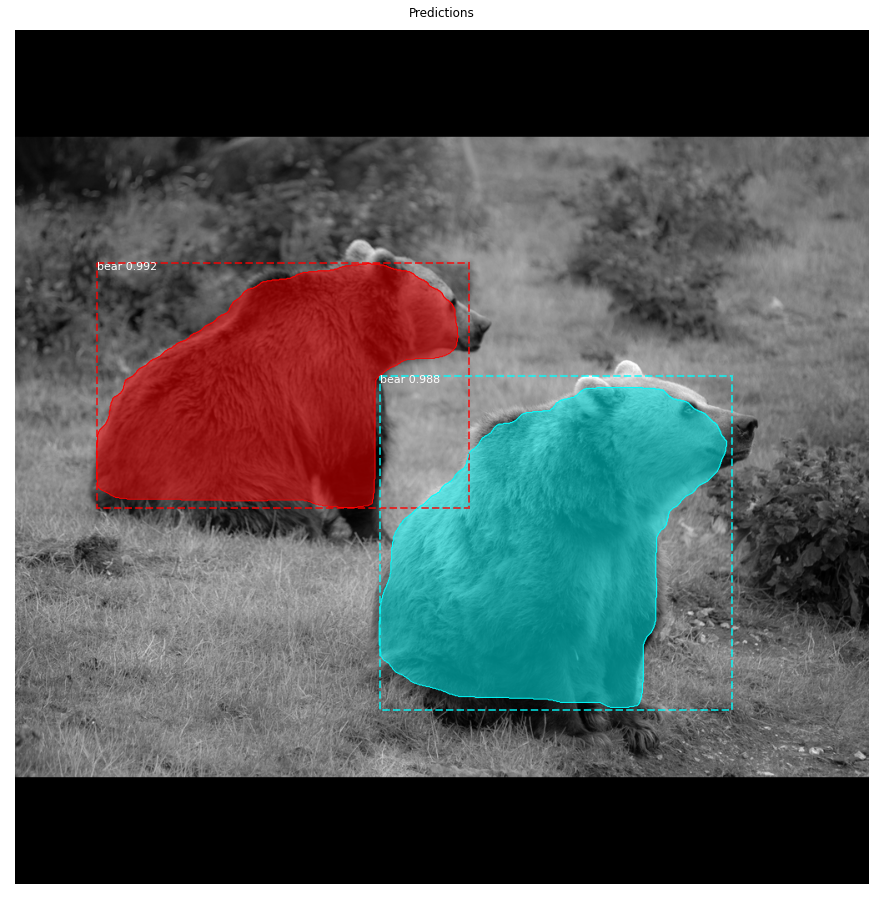

In [191]:
# Display results
x = get_ax(1)
r = results[0]
ax = plt.gca()
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], dataset.class_names, r['scores'], ax=ax, title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)


1
Processing 1 images
image                    shape: (768, 1024, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


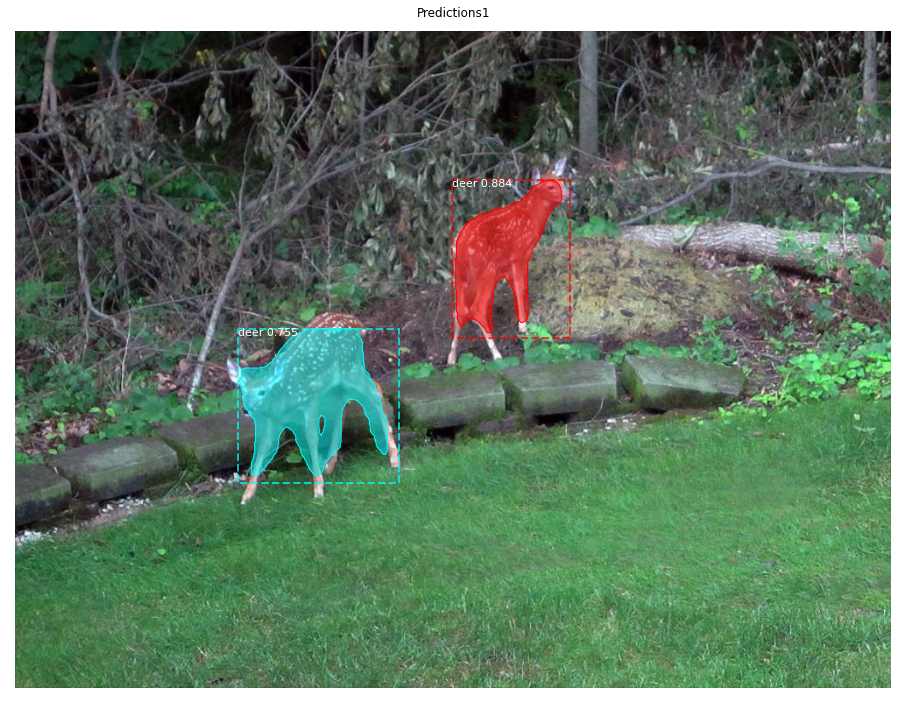

In [20]:
# This is for predicting images which are not present in dataset
path_to_new_image = "D:\\1.WorkFile\\via-2.0.12-Annotation tool\\Dataset\\valuation_set\\deer\\0aca09fcae7d6e3a.jpg"
image1 = mpimg.imread(path_to_new_image)

# Run object detection
print(len([image1]))
results1 = model.detect([image1], verbose=1)

# Display results
ax = get_ax(1)
r1 = results1[0]
visualize.display_instances(image1, r1['rois'], r1['masks'], r1['class_ids'],
dataset.class_names, r1['scores'], ax=ax, title="Predictions1")

1
Processing 1 images
image                    shape: (683, 1024, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


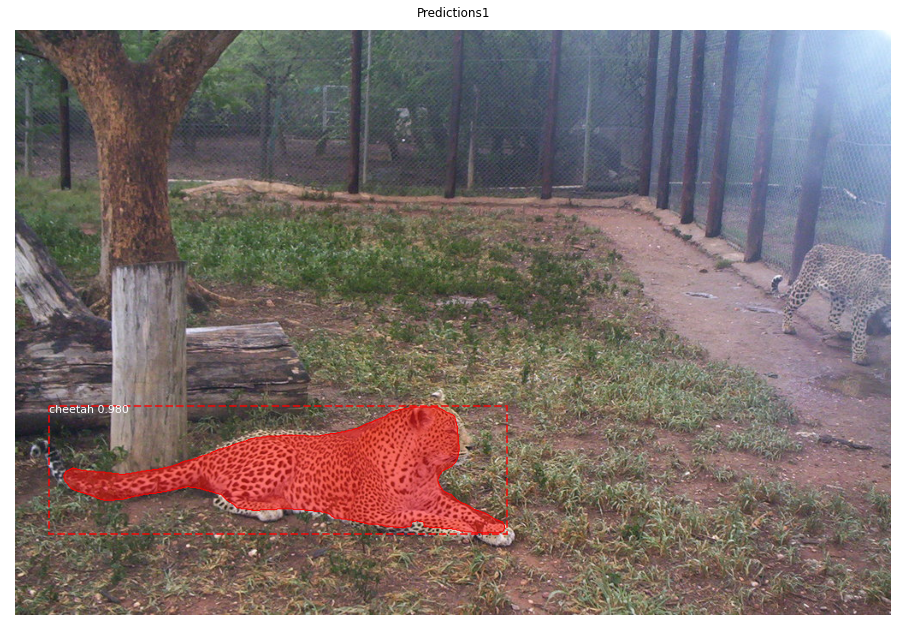

In [20]:
# This is for predicting images which are not present in dataset
path_to_new_image = "D:\\1.WorkFile\\Auto-Annotate-7classes\\images\\2.cheetah_kaggleOID_test\\1000b4c99a3d806f.jpg"
image1 = mpimg.imread(path_to_new_image)

# Run object detection
print(len([image1]))
results1 = model.detect([image1], verbose=1)

# Display results
ax = get_ax(1)
r1 = results1[0]
visualize.display_instances(image1, r1['rois'], r1['masks'], r1['class_ids'],
dataset.class_names, r1['scores'], ax=ax, title="Predictions1")

In [11]:
# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )

target_rpn_match         shape: (261888,)             min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (256, 4)              min:   -1.73340  max:    1.10352  float64
positive_anchors         shape: (5, 4)                min:   64.00000  max:  960.00000  float64
negative_anchors         shape: (251, 4)              min:  -90.50967  max: 1258.03867  float64
neutral anchors          shape: (261632, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (5, 4)                min:   89.00000  max:  892.00000  float32


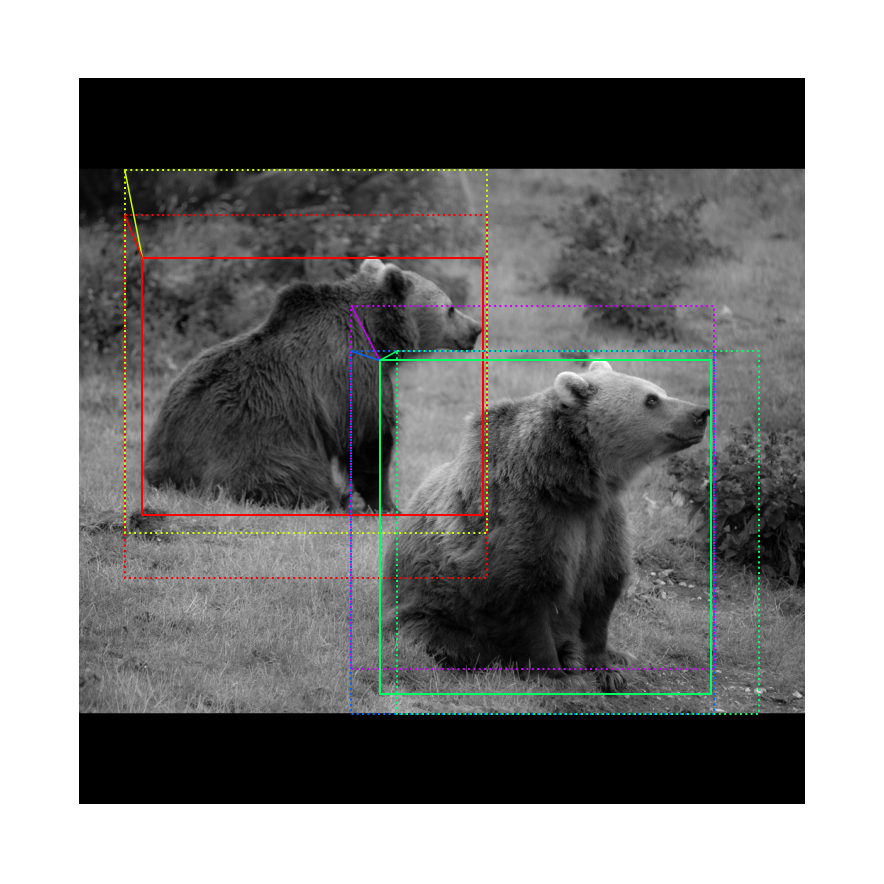

In [193]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(image, boxes=positive_anchors, refined_boxes=refined_anchors, ax=get_ax())

In [194]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 261888, 2)        min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.35390  max:    1.29134  float32
refined_anchors          shape: (1, 6000, 4)          min: -11702.72949  max: 11703.59863  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (43,)                 min:    0.00000  max: 2285.00000  int32
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


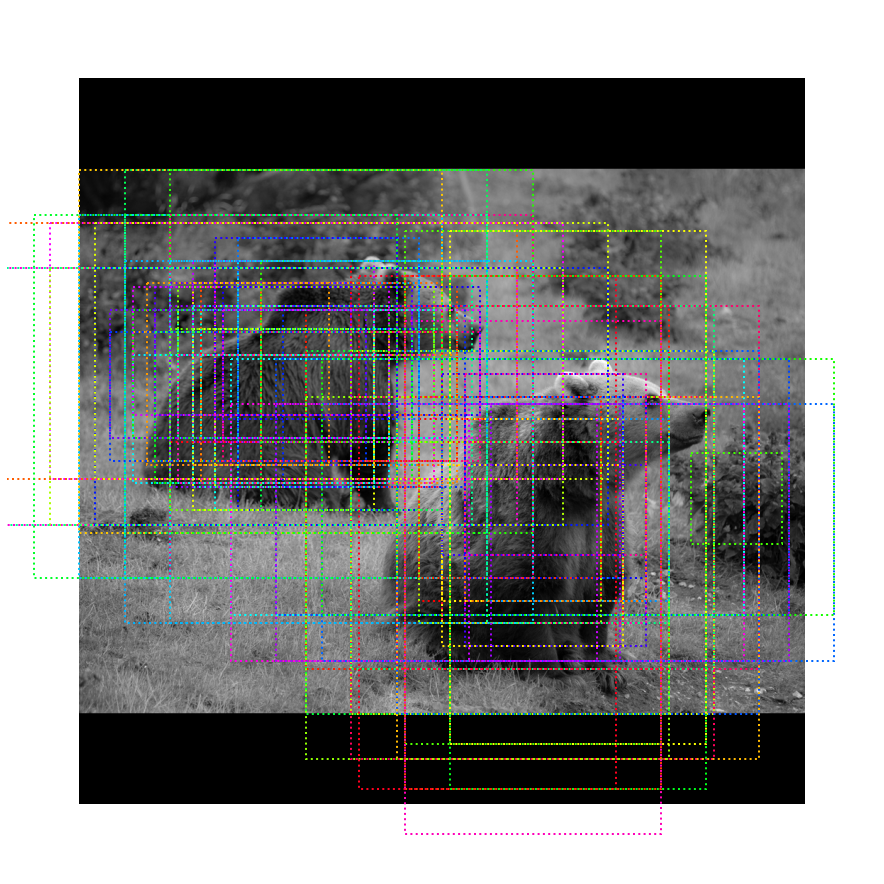

In [270]:
# Show top anchors by score (before refinement)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

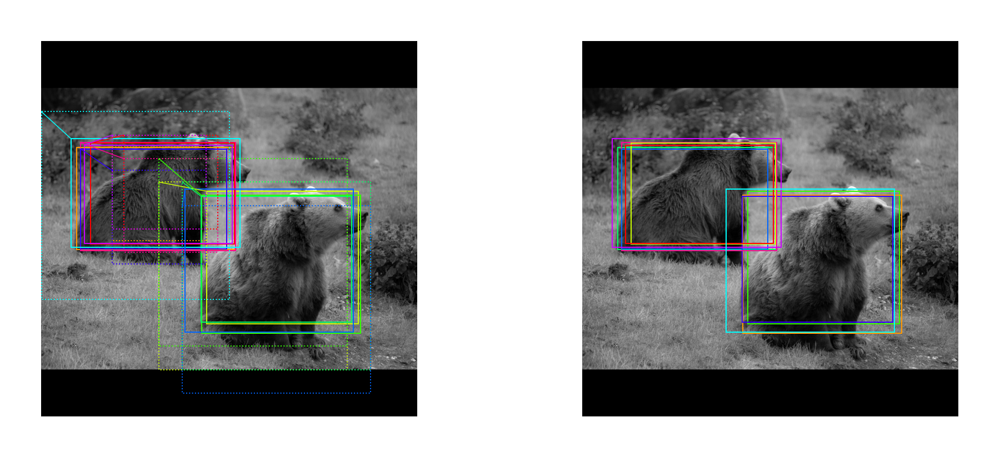

In [271]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 10
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

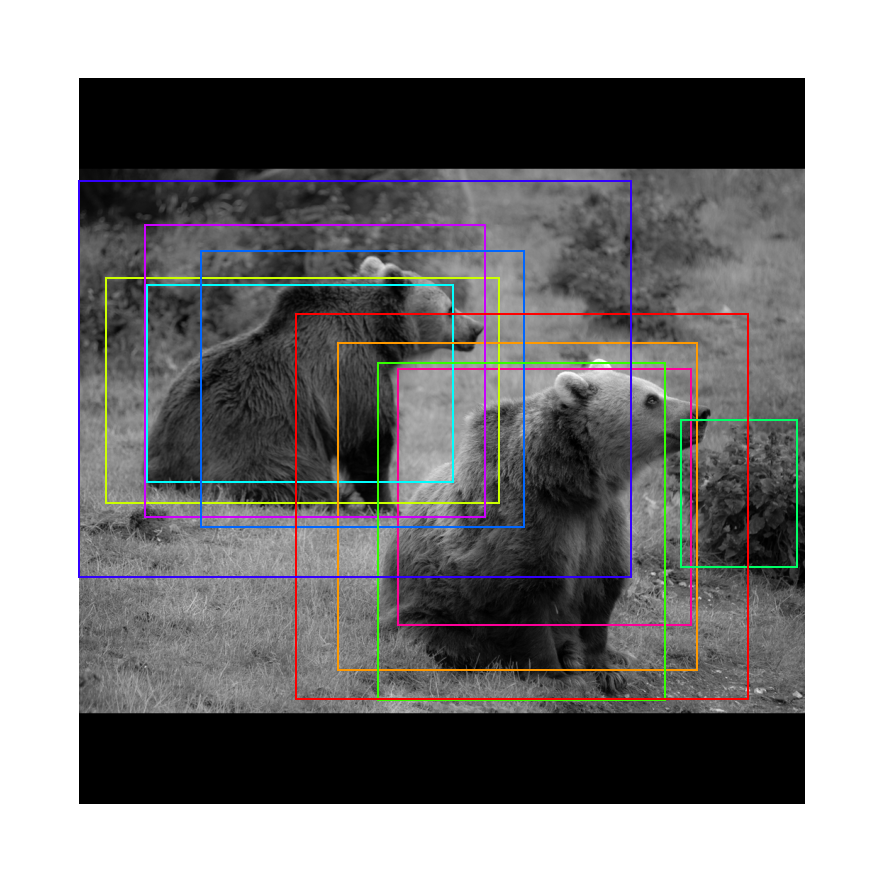

In [272]:
# Show refined anchors after non-max suppression
limit = 10
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

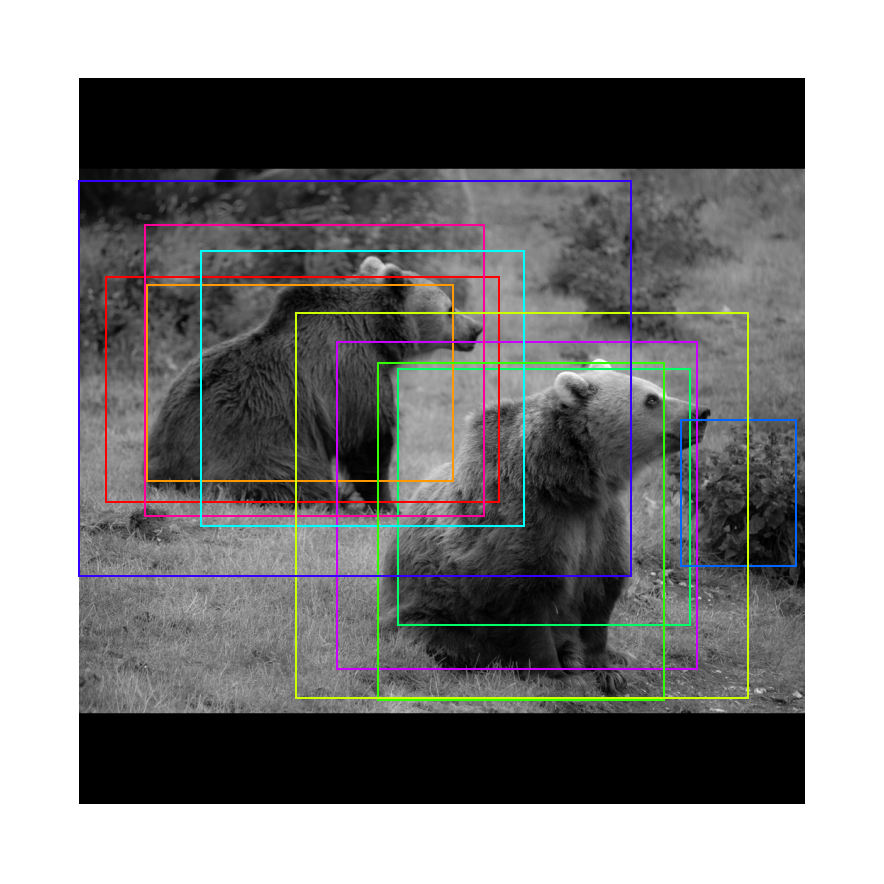

In [273]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 10
# Convert back to image coordinates for display
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

In [274]:
# Measure the RPN recall (percent of objects covered by anchors)
# Here we measure recall for 3 different methods:
# - All anchors
# - All refined anchors
# - Refined anchors after NMS
iou_threshold = 0.7

recall, positive_anchor_ids = utils.compute_recall(model.anchors, gt_bbox, iou_threshold)
print("All Anchors ({:5})       Recall: {:.3f}  Positive anchors: {}".format(
    model.anchors.shape[0], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(rpn['refined_anchors'][0], gt_bbox, iou_threshold)
print("Refined Anchors ({:5})   Recall: {:.3f}  Positive anchors: {}".format(
    rpn['refined_anchors'].shape[1], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(proposals, gt_bbox, iou_threshold)
print("Post NMS Anchors ({:5})  Recall: {:.3f}  Positive anchors: {}".format(
    proposals.shape[0], recall, len(positive_anchor_ids)))

All Anchors (261888)       Recall: 0.500  Positive anchors: 3
Refined Anchors ( 6000)   Recall: 0.000  Positive anchors: 0
Post NMS Anchors (   10)  Recall: 1.000  Positive anchors: 4


In [275]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 1000, 8)          min:    0.00000  max:    1.00000  float32
deltas                   shape: (1, 1000, 8, 4)       min:   -4.65314  max:    3.04497  float32
masks                    shape: (1, 100, 28, 28, 8)   min:    0.00000  max:    1.00000  float32
detections               shape: (1, 100, 6)           min:    0.00000  max:    1.00000  float32


2 detections: ['bear' 'bear']


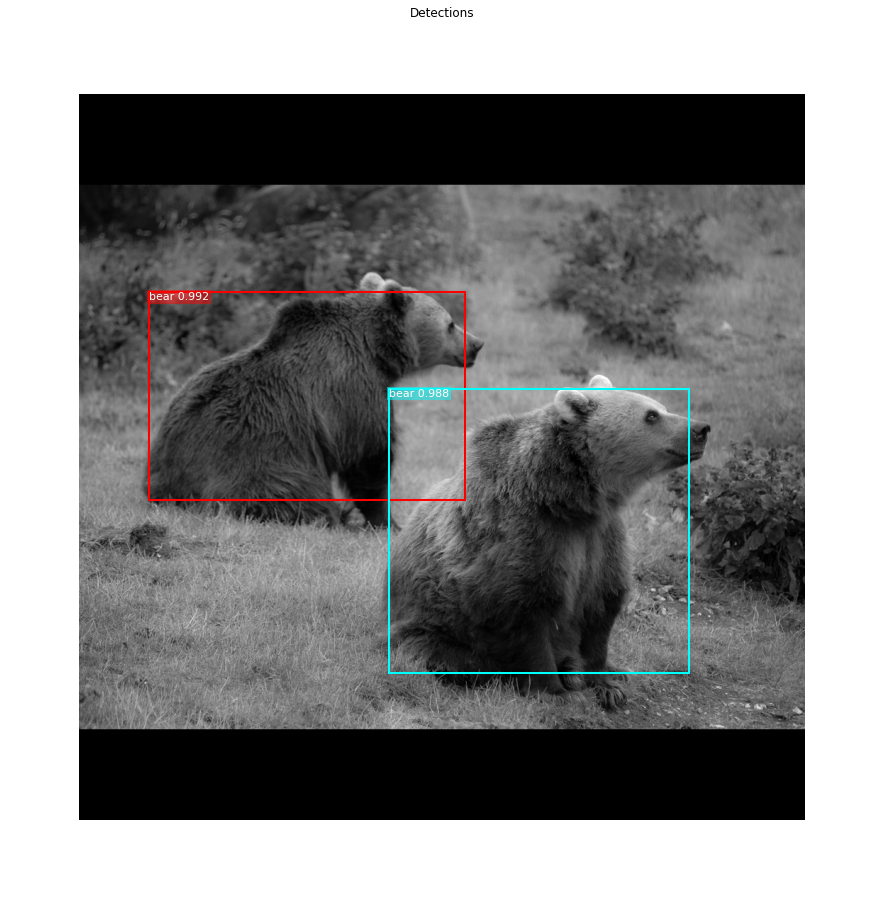

In [276]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

In [277]:
# Proposals are in normalized coordinates. Scale them
# to image coordinates.
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

43 Valid proposals out of 1000
9 Positive ROIs
[('BG', 991), ('bear', 9)]


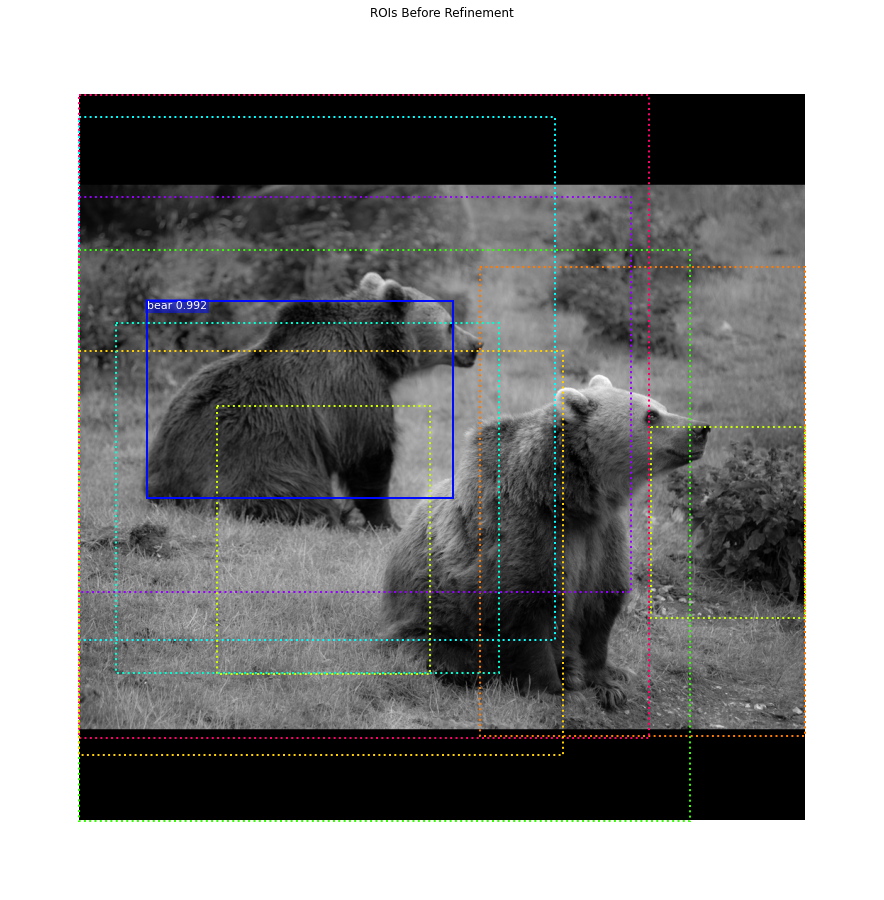

In [286]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinement",
                     ax=get_ax())

roi_bbox_specific        shape: (1000, 4)             min:   -1.99811  max:    1.83514  float32
refined_proposals        shape: (1000, 4)             min: -108.00000  max: 1178.00000  int32


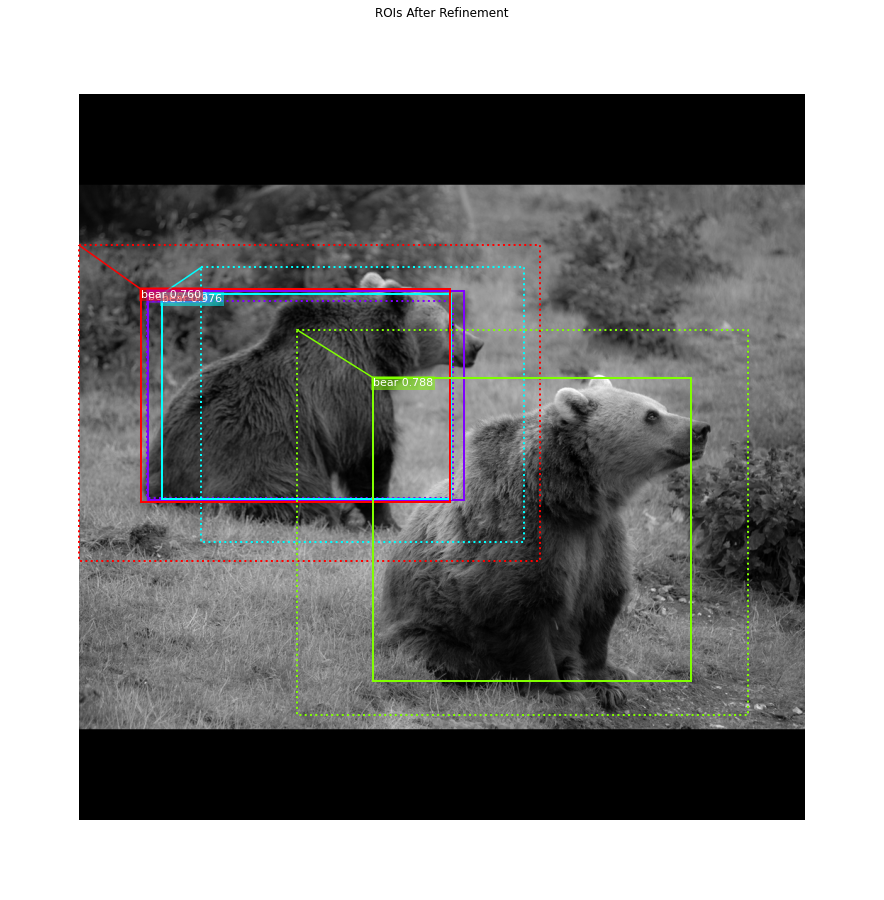

In [264]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 4
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax=get_ax())

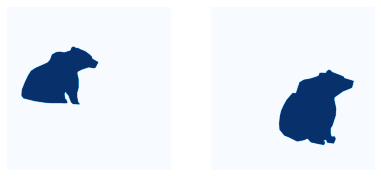

In [205]:
display_images(np.transpose(gt_mask, [2, 0, 1]), cmap="Blues")

In [206]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 100, 6)           min:    0.00000  max:    1.00000  float32
masks                    shape: (1, 100, 28, 28, 8)   min:    0.00000  max:    1.00000  float32
2 detections: ['bear' 'bear']


In [207]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (2, 28, 28)           min:    0.00000  max:    1.00000  float32
det_masks                shape: (2, 1024, 1024)       min:    0.00000  max:    1.00000  bool


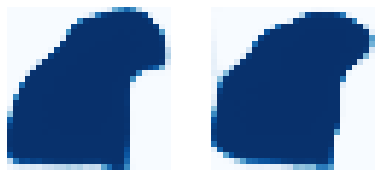

In [208]:
display_images(det_mask_specific[:8] * 255, cmap="Blues", interpolation="none")

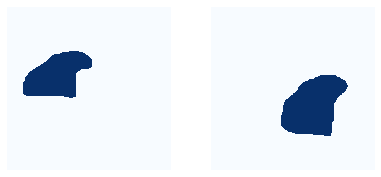

In [209]:
display_images(det_masks[:10] * 255, cmap="Blues", interpolation="none")

In [59]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    
    #stage 2 (1 conv_block and 2 ID_block) --- 9 layers
    ("res2a_out",          model.keras_model.get_layer("res2a_out").output),  # for resnet100
    ("res2b_out",          model.keras_model.get_layer("res2b_out").output),  # for resnet100
    ("res2c_out",          model.keras_model.get_layer("res2c_out").output),  # for resnet100
    
    #stage 3 (1 conv_block and 3 ID_block) --- 12 layers
    ("res3a_out",          model.keras_model.get_layer("res3a_out").output),  # for resnet100
    ("res3b_out",          model.keras_model.get_layer("res3b_out").output),  # for resnet100
    ("res3c_out",          model.keras_model.get_layer("res3c_out").output),  # for resnet100
    ("res3d_out",          model.keras_model.get_layer("res3d_out").output),  # for resnet100
    
    #stage 4 (1 conv_block and 22 ID_block) --- 69 layers
    ("res4a_out",          model.keras_model.get_layer("res4a_out").output),  # for resnet100
    ("res4b_out",          model.keras_model.get_layer("res4b_out").output),  # for resnet100
    
    ("res4w_out",          model.keras_model.get_layer("res4w_out").output),  # for resnet100
   
    #stage 5 (1 conv_block and 2 ID_block) --- 9 layers
    ("res5a_out",          model.keras_model.get_layer("res5a_out").output),  # for resnet100
    ("res5b_out",          model.keras_model.get_layer("res5b_out").output),  # for resnet100
    ("res5c_out",          model.keras_model.get_layer("res5c_out").output),  # for resnet100
    
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10001  float32
res2a_out                shape: (1, 256, 256, 256)    min:    0.00000  max:   19.43663  float32
res2b_out                shape: (1, 256, 256, 256)    min:    0.00000  max:   19.74218  float32
res2c_out                shape: (1, 256, 256, 256)    min:    0.00000  max:   21.09308  float32
res3a_out                shape: (1, 128, 128, 512)    min:    0.00000  max:   32.67258  float32
res3b_out                shape: (1, 128, 128, 512)    min:    0.00000  max:   29.59772  float32
res3c_out                shape: (1, 128, 128, 512)    min:    0.00000  max:   28.80074  float32
res3d_out                shape: (1, 128, 128, 512)    min:    0.00000  max:   31.06344  float32
res4a_out                shape: (1, 64, 64, 1024)     min:    0.00000  max:   37.89511  float32
res4b_out                shape: (1, 64, 64, 1024)     min:    0.00000  max:   37.84972  float32
res4w_out                shape: (1, 64, 

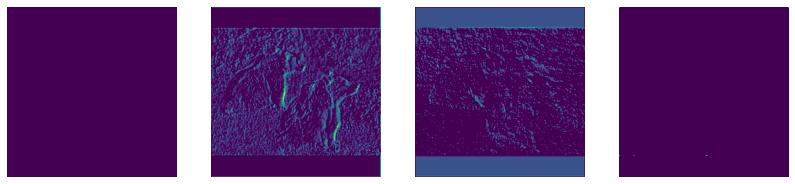

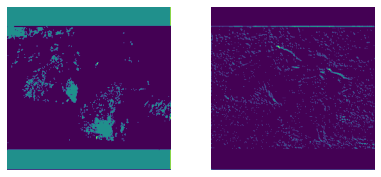

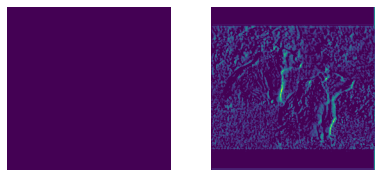

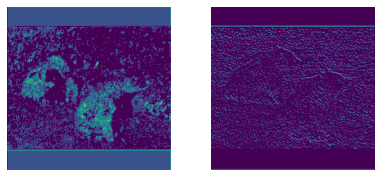

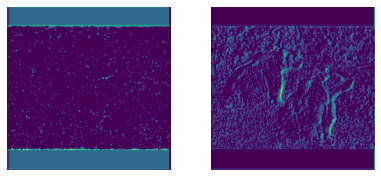

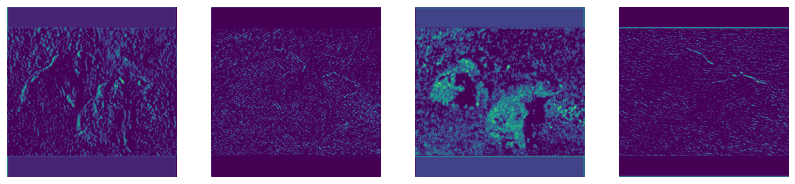

In [101]:
# Backbone feature map 2nd stage block a,b,c (256 combinations of activations in each block (0 to 255))
display_images(np.transpose(activations["res2a_out"][0,:,:,0:4], [2, 0, 1]))
display_images(np.transpose(activations["res2a_out"][0,:,:,254:256], [2, 0, 1]))
display_images(np.transpose(activations["res2b_out"][0,:,:,0:2], [2, 0, 1]))
display_images(np.transpose(activations["res2b_out"][0,:,:,254:256], [2, 0, 1]))
display_images(np.transpose(activations["res2c_out"][0,:,:,0:2], [2, 0, 1]))
display_images(np.transpose(activations["res2c_out"][0,:,:,252:256], [2, 0, 1]))

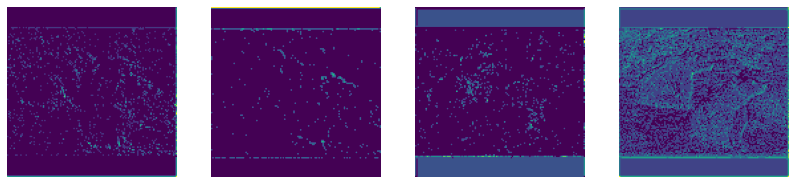

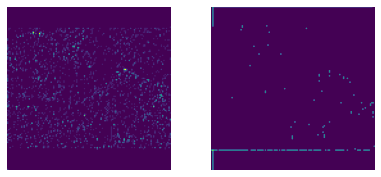

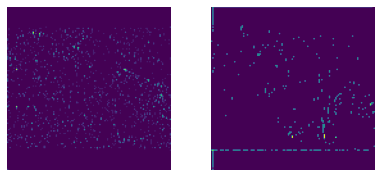

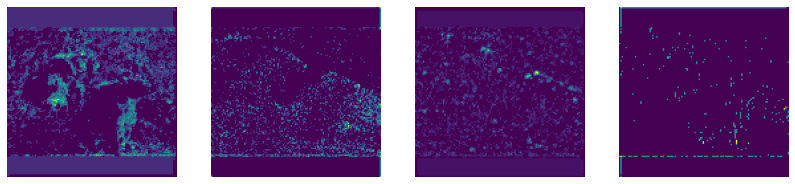

In [100]:
# Backbone feature map 3rd stage block a,b,c,d (512 combinations of activations in each block)
display_images(np.transpose(activations["res3a_out"][0,:,:,0:4], [2, 0, 1]))
display_images(np.transpose(activations["res3b_out"][0,:,:,510:512], [2, 0, 1]))
display_images(np.transpose(activations["res3c_out"][0,:,:,510:513], [2, 0, 1]))
display_images(np.transpose(activations["res3d_out"][0,:,:,508:512], [2, 0, 1]))

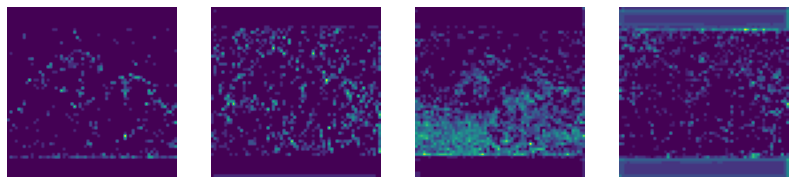

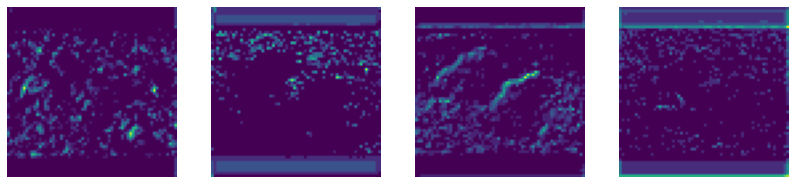

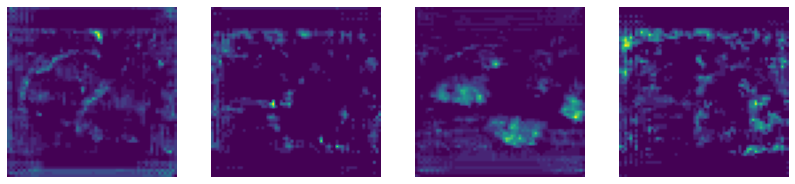

In [99]:
# Backbone feature map 4th stage block a,b,.......,w (1024 combinations of activations in each block)
display_images(np.transpose(activations["res4a_out"][0,:,:,1020:1024], [2, 0, 1]))
display_images(np.transpose(activations["res4b_out"][0,:,:,0:4], [2, 0, 1]))
display_images(np.transpose(activations["res4w_out"][0,:,:,1020:1024], [2, 0, 1]))

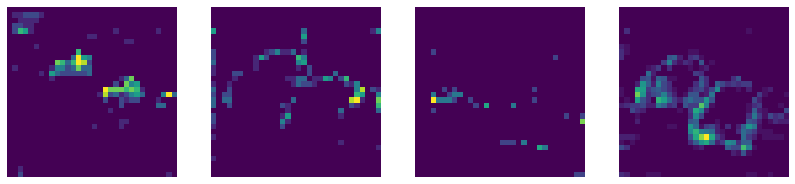

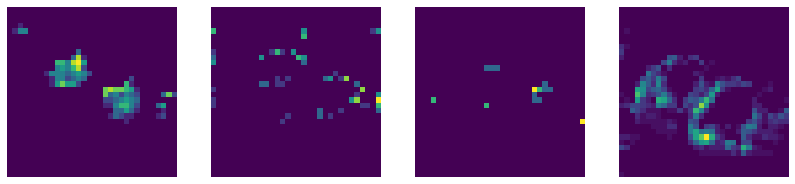

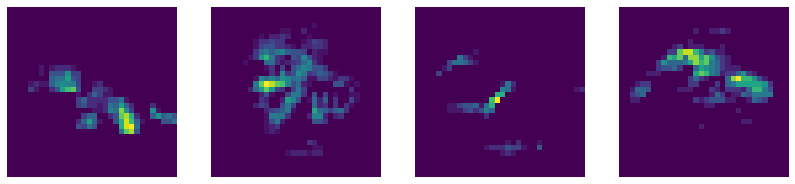

In [98]:
# Backbone feature map 5th stage block a,b,c (2048 combinations of activations in each block)
display_images(np.transpose(activations["res5a_out"][0,:,:,0:4], [2, 0, 1]))
display_images(np.transpose(activations["res5b_out"][0,:,:,:4], [2, 0, 1]))
display_images(np.transpose(activations["res5c_out"][0,:,:,2044:2048], [2, 0, 1]))

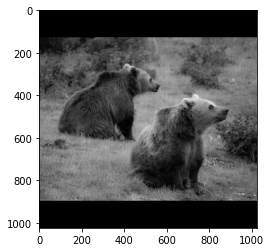

In [85]:
# Input image (normalized)
_ = plt.imshow(modellib.unmold_image(activations["input_image"][0],config))

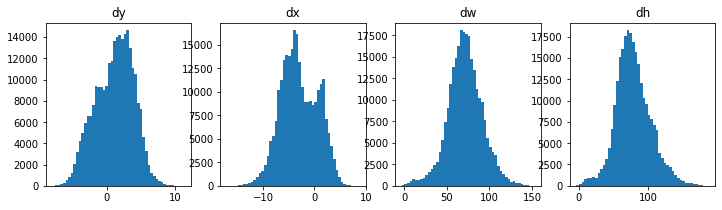

In [214]:
# Histograms of RPN bounding box deltas
plt.figure(figsize=(12, 3))
plt.subplot(1, 4, 1)
plt.title("dy")
_ = plt.hist(activations["rpn_bbox"][0,:,0], 50)
plt.subplot(1, 4, 2)
plt.title("dx")
_ = plt.hist(activations["rpn_bbox"][0,:,1], 50)
plt.subplot(1, 4, 3)
plt.title("dw")
_ = plt.hist(activations["rpn_bbox"][0,:,2], 50)
plt.subplot(1, 4, 4)
plt.title("dh")
_ = plt.hist(activations["rpn_bbox"][0,:,3], 50)

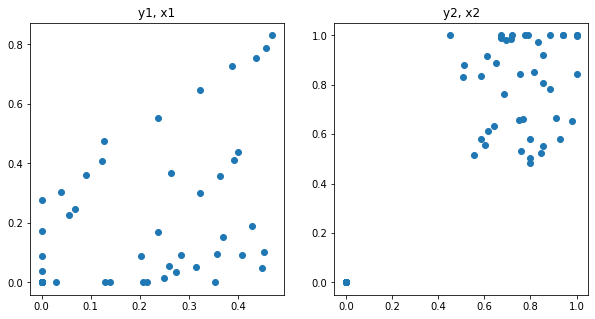

In [215]:
# Distribution of y, x coordinates of generated proposals
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("y1, x1")
plt.scatter(activations["roi"][0,:,0], activations["roi"][0,:,1])
plt.subplot(1, 2, 2)
plt.title("y2, x2")
plt.scatter(activations["roi"][0,:,2], activations["roi"][0,:,3])
plt.show()

1
Processing 1 images
image                    shape: (592, 1024, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


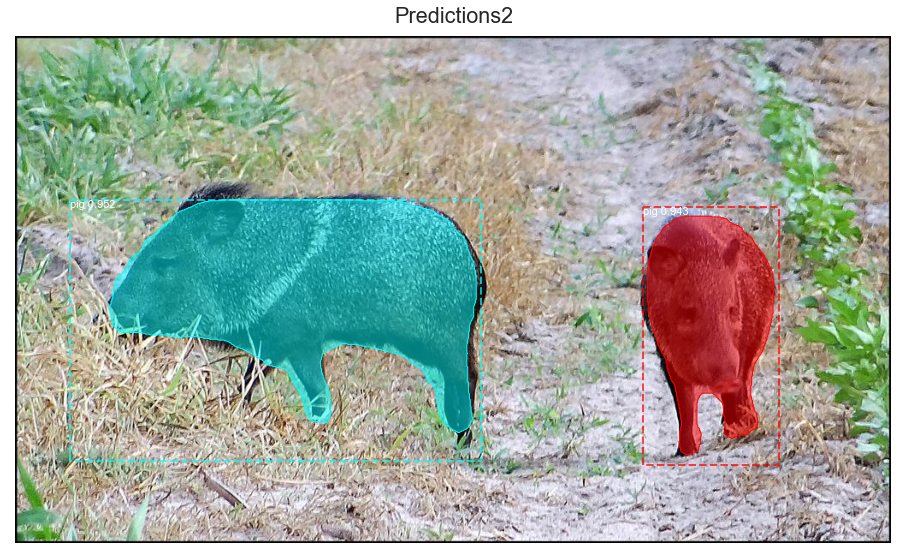

In [64]:
path_to_new_image = "D:\\1.WorkFile\\via-2.0.12-Annotation tool\\Dataset\\valuation_set\\pig\\1e898c79939fe41b.jpg"
image1 = mpimg.imread(path_to_new_image)

# Run object detection
print(len([image1]))
results1 = model.detect([image1], verbose=1)


# Display results
ax = get_ax(1)
r1 = results1[0]
visualize.display_instances(image1, r1['rois'], r1['masks'], r1['class_ids'],
dataset.class_names, r1['scores'], ax=ax, title="Predictions2")

1
Processing 1 images
image                    shape: (902, 1024, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


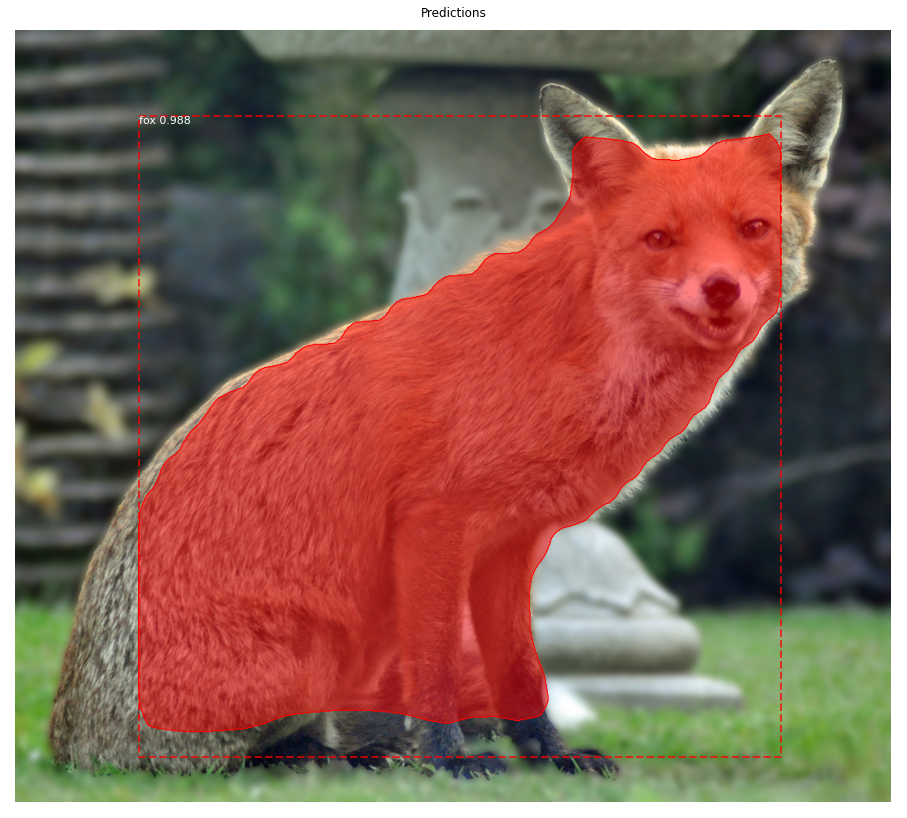

In [20]:
path_to_new_image = "D:\\1.WorkFile\\via-2.0.12-Annotation tool\\Dataset\\valuation_set\\fox\\a87cfae6d7612bf6.jpg"
image1 = mpimg.imread(path_to_new_image)

# Run object detection
print(len([image1]))
results1 = model.detect([image1], verbose=1)


# Display results
ax = get_ax(1)
r1 = results1[0]
visualize.display_instances(image1, r1['rois'], r1['masks'], r1['class_ids'],
dataset.class_names, r1['scores'], ax=ax, title="Predictions")

In [17]:
!pip install seaborn

In [18]:
!pip install scikit-learn

In [19]:
!pip install utils

In [10]:
import utils

total_gt = np.array([]) 
total_pred = np.array([]) 
mAP_ = [] #mAP list


#compute total_gt, total_pred and mAP for each image in the test dataset
# Compute total ground truth boxes(total_gt) and total predicted boxes(total_pred) and mean average precision for each Image 
#in the test dataset
for image_id in dataset.image_ids:
    image, image_meta, gt_class_id, gt_bbox, gt_mask =modellib.load_image_gt(dataset, config, image_id)#, #use_mini_mask=False)
    info = dataset.image_info[image_id]

    # Run the model
    results = model.detect([image], verbose=1)
    r = results[0]
    
    #compute gt_tot and pred_tot
    gt, pred = utils.gt_pred_lists(gt_class_id, gt_bbox, r['class_ids'], r['rois'])
    total_gt = np.append(total_gt, gt)
    total_pred = np.append(total_pred, pred)
    
    #precision_, recall_, AP_ 
    AP_, precision_, recall_, overlap_ = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'])
    #check if the vectors len are equal
    print("the actual length of the ground truth vect is : ", len(total_gt))
    print("the actual length of the predicted vect is : ", len(total_pred))
    
    mAP_.append(AP_)
    print("Average precision of this image : ",AP_)
    print("The actual mean average precision for the whole images", sum(mAP_)/len(mAP_))
    
    
import pandas as pd
total_gt=total_gt.astype(int)
total_pred=total_pred.astype(int)
#save the vectors of gt and pred
save_dir = "output"
gt_pred_tot_json = {"Total Groundtruth" : total_gt, "predicted box" : total_pred}
df = pd.DataFrame(gt_pred_tot_json)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
df.to_json(os.path.join(save_dir,"gt_pred_test.json"))

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  2
the actual length of the predicted vect is :  2
Average precision of this image :  1.0
The actual mean average precision for the whole images 1.0
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the

the actual length of the ground truth vect is :  18
the actual length of the predicted vect is :  18
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.7857142857142857
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  19
the actual length of the predicted vect is :  19
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.8
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  ma

molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  37
the actual length of the predicted vect is :  37
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.7698412704325858
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  39
the actual length of the predicted vect is :  39

the actual length of the ground truth vect is :  53
the actual length of the predicted vect is :  53
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.7696476968807903
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  54
the actual length of the predicted vect is :  54
Average precision of this image :  0.0
The actual mean average precision for the whole images 0.751322751716962
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: 

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  72
the actual length of the predicted vect is :  72
Average precision of this image :  0.0
The actual mean average precision for the whole images 0.7373737376747709
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.2

the actual length of the ground truth vect is :  86
the actual length of the predicted vect is :  86
Average precision of this image :  0.0
The actual mean average precision for the whole images 0.6405228760604764
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  150.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  87
the actual length of the predicted vect is :  87
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6457326894509043
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min:

image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  106
the actual length of the predicted vect is :  106
Average precision of this image :  0.0
The actual mean average precision for the whole images 0.6348238484403951
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  148.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the 

the actual length of the ground truth vect is :  126
the actual length of the predicted vect is :  126
Average precision of this image :  0.0
The actual mean average precision for the whole images 0.6400584797064462
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  127
the actual length of the predicted vect is :  127
Average precision of this image :  0.0
The actual mean average precision for the whole images 0.6333912038761708
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  143
the actual length of the predicted vect is :  143
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6243628951569945
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1

the actual length of the ground truth vect is :  160
the actual length of the predicted vect is :  160
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6336520948533803
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  161
the actual length of the predicted vect is :  161
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6366305331066049
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  234.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  178
the actual length of the predicted vect is :  178
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.64685457543123
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.2

the actual length of the ground truth vect is :  195
the actual length of the predicted vect is :  195
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6586502613770615
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  196
the actual length of the predicted vect is :  196
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6609259263012144
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    

the actual length of the ground truth vect is :  216
the actual length of the predicted vect is :  216
Average precision of this image :  0.5
The actual mean average precision for the whole images 0.6440013637328197
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  217
the actual length of the predicted vect is :  217
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6461720871246927
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    

the actual length of the ground truth vect is :  244
the actual length of the predicted vect is :  244
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6326114253584724
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  245
the actual length of the predicted vect is :  245
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6346754061148854
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    

the actual length of the ground truth vect is :  260
the actual length of the predicted vect is :  260
Average precision of this image :  0.0
The actual mean average precision for the whole images 0.6307446193112545
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  173.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:   69.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  261
the actual length of the predicted vect is :  261
Average precision of this image :  0.0
The actual mean average precision for the whole images 0.627459491085675
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    m

the actual length of the ground truth vect is :  284
the actual length of the predicted vect is :  284
Average precision of this image :  0.0
The actual mean average precision for the whole images 0.637425474519652
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  285
the actual length of the predicted vect is :  285
Average precision of this image :  0.0
The actual mean average precision for the whole images 0.6343311760996537
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    m

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  301
the actual length of the predicted vect is :  301
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6297818368791263
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  253.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  149.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1

the actual length of the ground truth vect is :  318
the actual length of the predicted vect is :  318
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.626819923605727
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  140.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  319
the actual length of the predicted vect is :  319
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6284215548348869
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    m

the actual length of the ground truth vect is :  332
the actual length of the predicted vect is :  332
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6277326108801978
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  138.20000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  333
the actual length of the predicted vect is :  333
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6292397663017355
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    

the actual length of the ground truth vect is :  353
the actual length of the predicted vect is :  353
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6317521369610077
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  356
the actual length of the predicted vect is :  356
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6331630483136476
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  249.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  373
the actual length of the predicted vect is :  373
Average precision of this image :  0.25
The actual mean average precision for the whole images 0.6417477699019323
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  138.20000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    

the actual length of the ground truth vect is :  392
the actual length of the predicted vect is :  392
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6411343401559692
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  132.20000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  394
the actual length of the predicted vect is :  394
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6423804014748721
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  408
the actual length of the predicted vect is :  408
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.644536729650376
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  146.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.

the actual length of the ground truth vect is :  423
the actual length of the predicted vect is :  423
Average precision of this image :  0.0
The actual mean average precision for the whole images 0.6417374382954241
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  424
the actual length of the predicted vect is :  424
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6428747797611529
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  438
the actual length of the predicted vect is :  438
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6509315720267169
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  138.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1

the actual length of the ground truth vect is :  464
the actual length of the predicted vect is :  464
Average precision of this image :  0.0
The actual mean average precision for the whole images 0.64126751406568
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  465
the actual length of the predicted vect is :  465
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6423164394631488
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    mi

the actual length of the ground truth vect is :  483
the actual length of the predicted vect is :  483
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6455555557644983
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  484
the actual length of the predicted vect is :  484
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.646551186225834
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    m

the actual length of the ground truth vect is :  498
the actual length of the predicted vect is :  498
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6386781092043275
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  149.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  500
the actual length of the predicted vect is :  500
Average precision of this image :  0.0
The actual mean average precision for the whole images 0.636951952152424
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    m

image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  523
the actual length of the predicted vect is :  523
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6375253845858927
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the 

the actual length of the ground truth vect is :  539
the actual length of the predicted vect is :  539
Average precision of this image :  1.0
The actual mean average precision for the whole images 0.6380611674151436
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  200.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:   81.20000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  540
the actual length of the predicted vect is :  540
Average precision of this image :  0.0
The actual mean average precision for the whole images 0.6364539604443247
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    

image ID: object.2063cc4372428468.jpg (174) D:\MaskRCNN\MaskRCNN_TF1_newiter5\Dataset\val\2063cc4372428468.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (2,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (2, 4)                min:   89.00000  max:  892.00000  int32
gt_mask                  shape: (1024, 1024, 2)       min:    0.00000  max:    1.00000  uint8


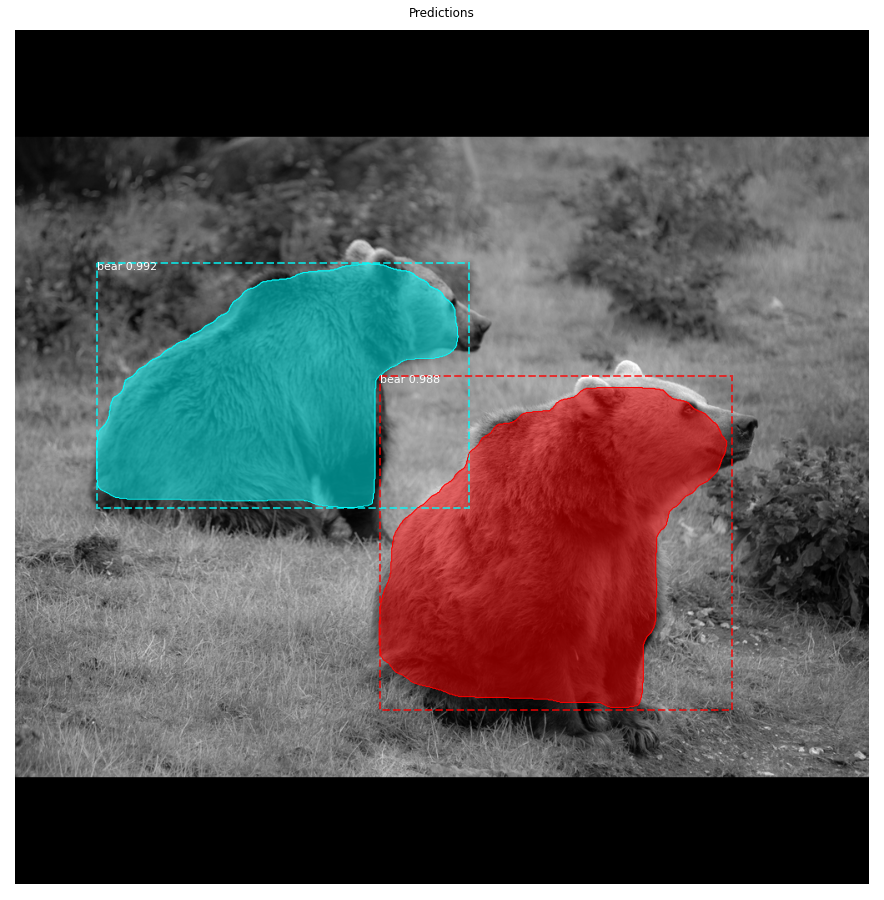

In [11]:
#Run detection 
#image_id = random.choice(dataset.image_ids)
image_id=174
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

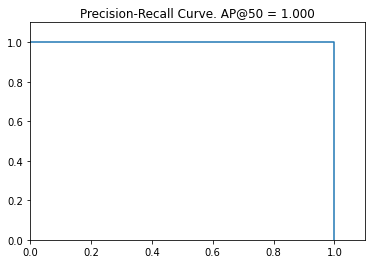

In [25]:
# Draw precision-recall curve
AP, precisions, recalls, overlaps = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'])
visualize.plot_precision_recall(AP, precisions, recalls)

In [11]:
# Compute VOC-style Average Precision
def compute_batch_ap(image_ids):
    APs = []
    for image_id in image_ids:
        # Load image
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, config,
                                   image_id, use_mini_mask=False)
        # Run object detection
        results = model.detect([image], verbose=0)
        # Compute AP
        r = results[0]
        AP, precisions, recalls, overlaps =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                              r['rois'], r['class_ids'], r['scores'], r['masks'])
        APs.append(AP)
    return APs

# Pick a set of random images- 400 images
image_ids = np.random.choice(dataset.image_ids, 400)
APs = compute_batch_ap(image_ids)
print("mAP @ IoU=50: ", np.mean(APs))

mAP @ IoU=50:  0.6478611114621162


In [12]:
def merged_mask(masks):
    """
    merge mask into one and return merged mask
    """
    n= masks.shape[2]
    
    if n!=0:        
        merged_mask = np.zeros((masks.shape[0], masks.shape[1]))
        for i in range(n):
            merged_mask+=masks[...,i]
        merged_mask=np.asarray(merged_mask,dtype=np.uint8)   
        return merged_mask
    return masks[:,:,0]


In [14]:
def compute_iou(predict_mask, gt_mask):
    """
    Computes Intersection over Union score for two binary masks.
    :param predict_mask: numpy array
    :param gt_mask: numpy array
    :type1 and type2 results are same
    :return iou score:
    """
    if predict_mask.shape[2]==0:
        return 0
    mask1 = merged_mask(predict_mask)
    mask2 = merged_mask(gt_mask)
    
    #type 1
    intersection = np.sum((mask1 + mask2) > 1)
    union = np.sum((mask1 + mask2) > 0)
    iou_score = intersection / float(union)
    #print("Iou 1 : ",iou_score)
    
    #type2
    intersection = np.logical_and(mask1, mask2)#*
    union = np.logical_or(mask1, mask2)# +
    iou_score = np.sum(intersection) / np.sum(union)
    #print("Iou 2 : ",iou_score)
    return iou_score


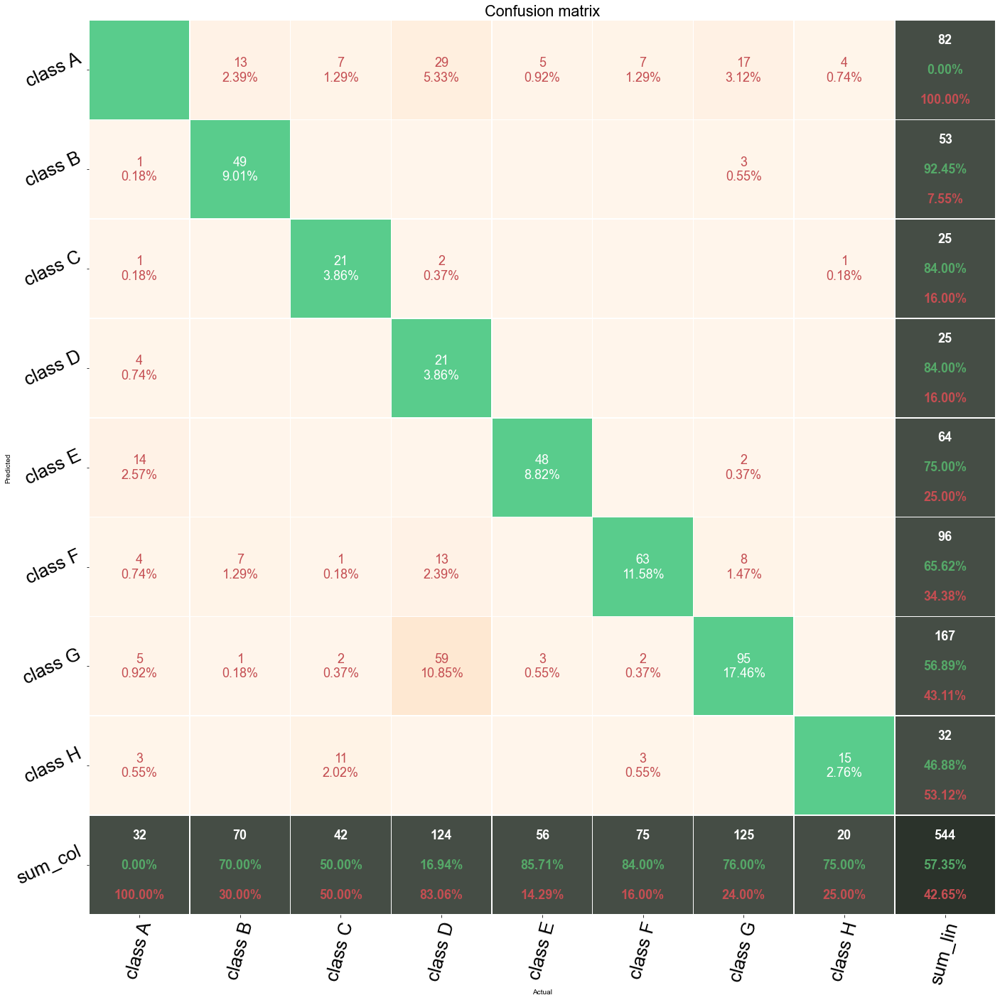

In [19]:
tp,fp,fn=utils.plot_confusion_matrix_from_data(total_gt,total_pred,fz=18, figsize=(20,20), lw=0.5)

In [20]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(total_gt,total_pred)

In [21]:
print(cm)

[[ 0  1  1  4 14  4  5  3]
 [13 49  0  0  0  7  1  0]
 [ 7  0 21  0  0  1  2 11]
 [29  0  2 21  0 13 59  0]
 [ 5  0  0  0 48  0  3  0]
 [ 7  0  0  0  0 63  2  3]
 [17  3  0  0  2  8 95  0]
 [ 4  0  1  0  0  0  0 15]]


In [79]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
print(classification_report(total_gt,total_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        32
           1       0.92      0.70      0.80        70
           2       0.84      0.50      0.63        42
           3       0.84      0.17      0.28       124
           4       0.75      0.86      0.80        56
           5       0.66      0.84      0.74        75
           6       0.57      0.76      0.65       125
           7       0.47      0.75      0.58        20

    accuracy                           0.57       544
   macro avg       0.63      0.57      0.56       544
weighted avg       0.69      0.57      0.57       544



In [2]:
import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt

In [9]:
array = [[0,1,1,4,14,4,5,3],
         [13,49,0,0,0,7,1,0], 
        [7,0,21,0,0,1,2,11], 
        [29,0,2,21,0,13,59,0], 
        [5,0,0,0,48,0,3,0], 
        [7,0,0,0,0,63,2,3], 
        [17,3,0,0,2,8,95,0], 
        [4,0,1,0,0,0,0,15]]

<AxesSubplot:>

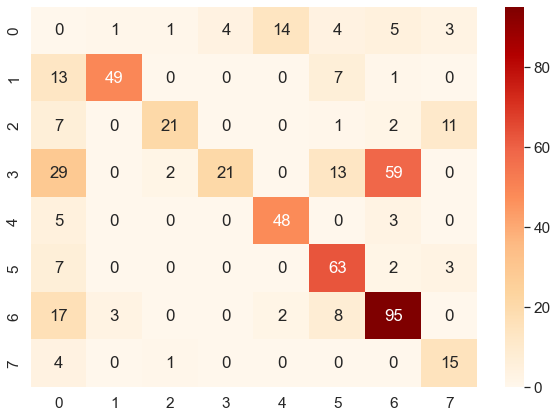

In [12]:
df_cm = pd.DataFrame(array, index = [i for i in "01234567"],
                  columns = [i for i in "01234567"])
plt.figure(figsize = (10,7))
sn.heatmap(df_cm, annot=True,cmap="OrRd")

In [15]:
array1 = [[49,0,0,0,7,1,0], 
        [0,21,0,0,1,2,11], 
        [0,2,21,0,13,59,0], 
        [0,0,0,48,0,3,0], 
        [0,0,0,0,63,2,3], 
        [3,0,0,2,8,95,0], 
        [0,1,0,0,0,0,15]]

<AxesSubplot:>

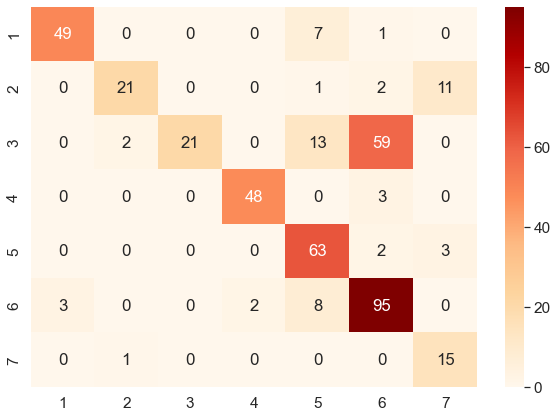

In [16]:
df_cm = pd.DataFrame(array1, index = [i for i in "1234567"],
                  columns = [i for i in "1234567"])
plt.figure(figsize = (10,7))
sn.heatmap(df_cm, annot=True,cmap="OrRd")